# Capstone Project - The Battle of Neighborhood

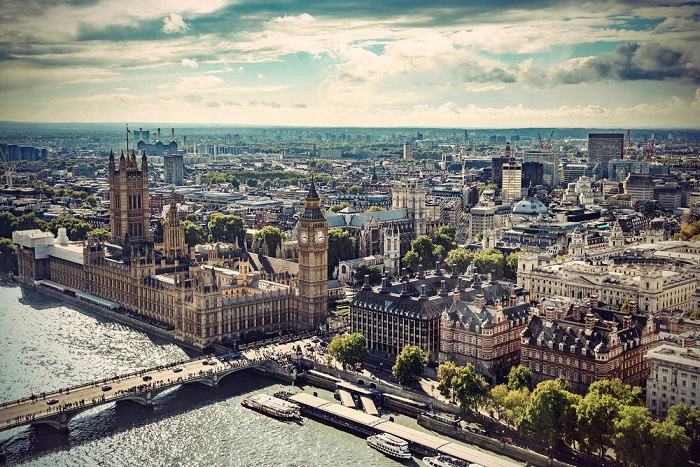

### Table of contents
* [Introduction](#introduction)
* [Data](#data)
* [DataWrangling](#datawrangling)
* [Exploratory Data Analysis](#exploratory)
* [Discussion and Conclusion](#discussion&conclusion)

## Introduction<a name="introduction"></a>

#### Background
London is the economic and political center of UK, and its land prices have always been high. Before Brexit earlier in this year, someone warned that if Brexit, the value houses in UK may fall and this will have an impact on the British market. Recently, the impact of coronavirus has also shocked the UK housing market, according to Global Property Consultancy, UK house prices would probably fall by 3% in 2020, and expects the prices to recover in 2021. In current scenario, it could be a new opportunity for business operators and investors.

#### Problem
The land price directly affects the operating conditions of some commercial operators, that could be reflected through leasing or purchasing the land to operate, especially have more impacts on the catering industry. Usually, the rent costs accounts for a large portion of the expenditure. therefore, the choice of location and whether the operator could balance the revenue and the cost are of vital importance.

To explore this issue, we will explore the components of venues in the Greater London area, the distribution of regional land prices, what venues are popular with the public, and recommend different business model based on the operator's own situation.

#### Interested Audience
People who are moving to large cities as well as new immigrants that want to start their own businesses, catering in this case, are more likely interested in this case.

## Data<a name="data"></a>

#### Data that will be collected:
1. List of postcode and coordinates of Greater London area
2. List of average land value and value change for the area covered under certarin postcodes
3. List of venues information around given postcodes (venue latitude, longitude and category)
4. Most common and popular venues in Greater London area

The location that includes the postcode and coordinates of Greater London area are extracted from www.doogal.co.uk, which collects and sort out UK postcodes as well as data from Land Registry data from GOV.UK, and this website has more clear and organized data provided to public. These data are used to search land value information through Zoopla, nearby venues information through FourSquare, as well as be plotted on maps.

The land value information comes from www.zoopla.co.uk is a property website, which is more reliable because it updates housing market information on a monthly basis. This website provides API to obtain data, however the free version has a lot of restrictions, so the web crawler is used to get land value information. The land value data are used to identify how the highest and lowest land value area distributed, and it will be helpful to indicate different business models and strategies. The value change could be used to decide future trend to make better decisions.

To explore a given location, such as London in this case, the FourSquare API is used to get the most common venue categories in each postcode area, which are used to group postcode into clusters and build visualization.


## DataWrangling<a name="datawrangling"></a>

Import necessary libraries.

In [3]:
import pandas as pd
import requests
import re
import numpy as np
#!conda install -c conda-forge beautifulsoup4 --yes
from bs4 import BeautifulSoup
import json # library to handle JSON files

from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

#Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

#!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering library
from folium import plugins
#!conda install -c conda-forge wordcloud==1.4.1 --yes
from wordcloud import WordCloud, STOPWORDS
print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - wordcloud==1.4.1


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    wordcloud-1.4.1            |           py36_0         324 KB  conda-forge

The following NEW packages will be INSTALLED:

    wordcloud: 1.4.1-py36_0 conda-forge


wordcloud-1.4.1      | 324 KB    | ##################################### | 100% 
Preparing transaction: done
Verifying transaction: done
Executing transaction: done
Libraries imported.


#### Obtain and clean Greater London data

Use pandas read_csv method to read the csv file, replace all blank cells with NANs, drop all unnecessary columns and NANs.

In [13]:
path1='https://www.doogal.co.uk/CountiesCSV.ashx?county=E11000009'
raw_data=pd.read_csv(path1,usecols=['Postcode','In Use?','Latitude','Longitude'])

In [14]:
raw_data.replace('No',np.nan,inplace=True)
raw_data.dropna(axis=0, inplace=True)
raw_data.drop(['In Use?'],axis=1,inplace=True)
raw_data.reset_index(drop=True, inplace=True)
print(raw_data.shape)
raw_data.head()

(176922, 3)


,Postcode,Latitude,Longitude
0,BR1 1AA,51.401546,0.015415
1,BR1 1AB,51.406333,0.015208
2,BR1 1AE,51.404543,0.014195
3,BR1 1AF,51.401392,0.014948
4,BR1 1AG,51.401392,0.014948


As there are more than 170,000 data, and we need web crawler crawl the land value information from www.zoopla.co.uk, and that would take long time to obtain and process these data, we simplely choose the first part of the postcode to stand for certain regions.

In [15]:
raw_data['Postcode']=raw_data.Postcode.str.split(expand=True)[0]
london_data=raw_data.groupby('Postcode').mean().reset_index()
london_data.head()

,Postcode,Latitude,Longitude
0,BR1,51.412007,0.020858
1,BR2,51.387282,0.022403
2,BR3,51.404585,-0.030556
3,BR4,51.375123,-0.008384
4,BR5,51.391689,0.103339


Define a function to build connection with website.

In [16]:
def getXMLText(url):
    try:
        ua = {'User-Agent' : 'Mozilla/5.0 (Windows NT 6.1; WOW64) \
AppleWebKit/537.36 (KHTML, like Gecko) Chrome/47.0.2526.73 Safari/537.36'}
        r = requests.get(url, headers = ua, timeout = 30)
        r.raise_for_status()
        r.encoding = r.apparent_encoding
        return r.text
    except:
        return ""

Crawl Zoopla to obtain land value and value change by searching each postcode, then put all data as a whole dataframe.

In [17]:
start_url1='https://www.zoopla.co.uk/house-prices/browse/'
price1=pd.DataFrame(columns=['Average Value', 'Value Change%'])

for postcode in london_data['Postcode']:
    url1=start_url1+postcode+'/?q='+postcode
    xml1=getXMLText(url1)
    try:
        soup1=BeautifulSoup(xml1,"lxml")
        avg_price_tag1=soup1.find('span',{'class':'market-panel-stat-element-value js-market-stats-average-value'})
        div_tag=soup1.find('div',{'class':'market-panel-stats'})
        content1=re.findall(r'-?\d+',avg_price_tag1.find(text=True))
        content2=re.search(r'-?\d+.\d+',div_tag.findChildren()[-1].find(text=True)).group()
        content1=''.join(content1)
        price1=price1.append({'Average Value':content1,'Value Change%':content2},ignore_index=True)
    except:
        price1=price1.append({'Average Value':'','Value Change%':''},ignore_index=True)

In [19]:
london_data=pd.concat([london_data, price1], axis=1)

In [20]:
london_data.replace('',np.nan,inplace=True)
london_data.dropna(axis=0, inplace=True)
london_data.reset_index(drop=True, inplace=True)
london_data = london_data.astype({'Average Value':'int64', 'Value Change%':'float64'}) 
london_data.head()

,Postcode,Latitude,Longitude,Average Value,Value Change%
0,BR1,51.412007,0.020858,530834,5.52
1,BR2,51.387282,0.022403,570400,8.37
2,BR3,51.404585,-0.030556,592643,7.03
3,BR4,51.375123,-0.008384,595940,7.20
4,BR5,51.391689,0.103339,453718,7.02


## Exploratory Data Analysis<a name="exploratory"></a>

Use the geopy library to get the latitude and longitude of Greater London

In [21]:
address = 'Greater London, UK'

geolocator = Nominatim(user_agent="london_explorer")
location_L = geolocator.geocode(address)
latitude_L = location_L.latitude
longitude_L = location_L.longitude
print('The geograpical coordinate of London are {}, {}.'.format(latitude_L, longitude_L))

The geograpical coordinate of London are 51.4893335, -0.14405508452768728.


As we are exploring the the land value in the Greater London area, we divide data in to three parts according the average land value, top 50 valued areas, middle 50 valued areas, and least 50 valued areas and observe their distribution. However, we mainly focus on the top and least 50 areas.

In [22]:
london_data.sort_values(['Average Value'], ascending=False, axis=0, inplace=True)
london_data.reset_index(drop=True, inplace=True)
london_top50=london_data.head(50)
london_least50=london_data.tail(50)
london_least50.reset_index(drop=True, inplace=True)
london_middle50=london_data.iloc[115:165,:]
london_middle50.reset_index(drop=True, inplace=True)

In [23]:
london_top50.head()

,Postcode,Latitude,Longitude,Average Value,Value Change%
0,W8,51.501117,-0.194341,2934264,3.50
1,SW7,51.496283,-0.177013,2377922,6.01
2,SW3,51.489069,-0.165659,2364635,7.33
3,W11,51.512296,-0.216009,2024174,2.21
4,W1W,51.519212,-0.140903,1847918,3.55


In [24]:
london_least50.head()

,Postcode,Latitude,Longitude,Average Value,Value Change%
0,KT9,51.363935,-0.303136,409523,0.99
1,DA14,51.425087,0.111488,409500,3.85
2,DA7,51.465611,0.145997,408324,3.47
3,TW3,51.468088,-0.363998,403938,2.11
4,TW15,51.436343,-0.441591,402905,0.53


#### Create a map of London according to the groups

The darkred circles represent the top 50 valued areas, the red circles represent the middle 50 valued areas, and the pink circles represent the least 50 valued areas.

 We could see that the most valued areas are located in the centre of London, and the least valued areas are located outer of London.

In [25]:
data_frame=[london_top50,london_middle50,london_least50]
color=['darkred','red','lightpink']

map_london50 = folium.Map(location=[latitude_L, longitude_L], zoom_start=11,tiles='cartodbpositron')
#incidents = plugins.MarkerCluster().add_to(map_london50)

for data,color in zip(data_frame,color):
    for lat, lng, postcode, avg_value in zip(data['Latitude'], data['Longitude'], data['Postcode'], data['Average Value']):
        label = 'Postcode: {}, Average Value: {}'.format(postcode, avg_value)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker([lat, lng],radius=10,popup=label,color=color,fill=True,fill_opacity=0.7,parse_html=False).add_to(map_london50)
        #folium.Marker(location=[lat, lng],icon=None,popup=label).add_to(incidents)
map_london50


#### Connect with Foursquare API to explore further

Declare API Credentials and Version.

In [26]:
CLIENT_ID = 'E4RLFDQEEK4HHJRPLAW1FUWLST34UJZ3WVE3GEZSONR1QDJK' # your Foursquare ID
CLIENT_SECRET = 'TNZZGUV10C3KOLNY1ESMVMUZED5VSVLYIUTXKX0IBAZKYRAB' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

Function to repeat the same process to all the postcode to get certain venue information.

In [27]:
def getNearbyVenues(names, latitudes, longitudes, radius, LIMIT):
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Postcode', 
                  'Postcode Latitude', 
                  'Postcode Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    return(nearby_venues)

In [28]:
london_top50_venues = getNearbyVenues(names=london_top50['Postcode'],
                                   latitudes=london_top50['Latitude'],
                                   longitudes=london_top50['Longitude'], radius=3500, LIMIT=150
                                  )
london_least50_venues = getNearbyVenues(names=london_least50['Postcode'],
                                   latitudes=london_least50['Latitude'],
                                   longitudes=london_least50['Longitude'], radius=3500, LIMIT=150
                                  )

In [29]:
london_top50_venues.head()

,Postcode,Postcode Latitude,Postcode Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,W8,51.501117,-0.194341,Whole Foods Market,51.501716,-0.190179,Grocery Store
1,W8,51.501117,-0.194341,Dishoom,51.501301,-0.191170,Indian Restaurant
2,W8,51.501117,-0.194341,Café Phillies,51.499726,-0.197747,Café
3,W8,51.501117,-0.194341,JOE & THE JUICE,51.502339,-0.189985,Juice Bar
4,W8,51.501117,-0.194341,Montparnasse Cafe,51.500528,-0.189055,French Restaurant


In [30]:
london_least50_venues.head()

,Postcode,Postcode Latitude,Postcode Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,KT9,51.363935,-0.303136,White Spider Climbing Wall,51.372366,-0.291340,Climbing Gym
1,KT9,51.363935,-0.303136,Rhonas Cafe,51.363858,-0.299578,Breakfast Spot
2,KT9,51.363935,-0.303136,Sea Life,51.349517,-0.315635,Aquarium
3,KT9,51.363935,-0.303136,Dragon's Fury,51.347825,-0.319160,Theme Park Ride / Attraction
4,KT9,51.363935,-0.303136,Vampire,51.346975,-0.315961,Theme Park Ride / Attraction


Set dummy variable of category that if a postcode location has this type of categroy, the value will be 1, otherwise 0. Then, count the mean to get its frequency.

In [31]:
# one hot encoding
london_top50_onehot = pd.get_dummies(london_top50_venues[['Venue Category']], prefix="", prefix_sep="")
london_least50_onehot = pd.get_dummies(london_least50_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
london_top50_onehot['Postcode'] = london_top50_venues['Postcode'] 
london_least50_onehot['Postcode'] = london_least50_venues['Postcode'] 

# move neighborhood column to the first column
fixed_columns_top = [london_top50_onehot.columns[-1]] + list(london_top50_onehot.columns[:-1])
london_top50_onehot = london_top50_onehot[fixed_columns_top]
fixed_columns_least = [london_least50_onehot.columns[-1]] + list(london_least50_onehot.columns[:-1])
london_least50_onehot = london_least50_onehot[fixed_columns_least]

london_top50_grouped = london_top50_onehot.groupby('Postcode').mean().reset_index()
london_least50_grouped = london_least50_onehot.groupby('Postcode').mean().reset_index()

In [32]:
london_top50_grouped.head()

,Postcode,American Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,BBQ Joint,...,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Waterfront,Wine Bar,Wine Shop,Wings Joint,Yoga Studio,Zoo,Zoo Exhibit
0,N2,0.01,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0,...,0.04,0.00,0.00,0.0,0.00,0.01,0.00,0.00,0.01,0.00
1,N6,0.01,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0,...,0.01,0.00,0.00,0.0,0.02,0.01,0.00,0.00,0.00,0.00
2,NW1,0.01,0.0,0.01,0.0,0.01,0.0,0.00,0.0,0.0,...,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.02,0.00,0.03
3,NW11,0.01,0.0,0.01,0.0,0.01,0.0,0.00,0.0,0.0,...,0.05,0.00,0.00,0.0,0.00,0.01,0.00,0.00,0.01,0.00
4,NW3,0.00,0.0,0.00,0.0,0.01,0.0,0.01,0.0,0.0,...,0.01,0.01,0.01,0.0,0.01,0.01,0.01,0.01,0.02,0.03


In [33]:
london_least50_grouped.head()

,Postcode,Accessories Store,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,American Restaurant,Antique Shop,Aquarium,...,Turkish Restaurant,Video Game Store,Vietnamese Restaurant,Warehouse Store,Water Park,Weight Loss Center,Windmill,Wine Bar,Wine Shop,Women's Store
0,BR8,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,...,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0
1,CR0,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.0,0.0,...,0.00,0.00,0.00,0.01,0.0,0.0,0.0,0.00,0.0,0.0
2,CR4,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,...,0.00,0.00,0.01,0.00,0.0,0.0,0.0,0.01,0.0,0.0
3,CR7,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,...,0.01,0.00,0.01,0.00,0.0,0.0,0.0,0.00,0.0,0.0
4,DA1,0.0,0.0,0.00,0.0,0.0,0.0,0.01,0.0,0.0,...,0.00,0.01,0.00,0.01,0.0,0.0,0.0,0.00,0.0,0.0


Function to sort the venues in descending order.

In [34]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    return row_categories_sorted.index.values[0:num_top_venues]

Create the new dataframe and display the top 10 venues for each postcode location. We could see that for different locations, the most common are not the same, which means that the popularity of type of venue for different locations are also different.

In [35]:
num_top_venues = 10
indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Postcode']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
top50_venues_sorted = pd.DataFrame(columns=columns)
top50_venues_sorted['Postcode'] = london_top50_grouped['Postcode']
least50_venues_sorted = pd.DataFrame(columns=columns)
least50_venues_sorted['Postcode'] = london_least50_grouped['Postcode']

for ind in np.arange(london_top50_grouped.shape[0]):
    top50_venues_sorted.iloc[ind, 1:] = return_most_common_venues(london_top50_grouped.iloc[ind, :], num_top_venues)
for ind in np.arange(london_least50_grouped.shape[0]):
    least50_venues_sorted.iloc[ind, 1:] = return_most_common_venues(london_least50_grouped.iloc[ind, :], num_top_venues)

In [36]:
top50_venues_sorted.replace(' ','_',regex=True,inplace=True)
top50_venues_sorted.head()

,Postcode,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,N2,Park,Pub,Café,Bakery,Coffee_Shop,Turkish_Restaurant,Grocery_Store,Forest,Italian_Restaurant,Gym_/_Fitness_Center
1,N6,Pub,Park,Coffee_Shop,Gastropub,Bakery,Café,Pizza_Place,Movie_Theater,Japanese_Restaurant,Trail
2,NW1,Hotel,Pizza_Place,Pub,Garden,Movie_Theater,Zoo_Exhibit,Bakery,Bookstore,Cocktail_Bar,Coffee_Shop
3,NW11,Park,Grocery_Store,Pub,Bakery,Turkish_Restaurant,Italian_Restaurant,Coffee_Shop,Café,Korean_Restaurant,Sushi_Restaurant
4,NW3,Park,Pub,Bakery,Coffee_Shop,Zoo_Exhibit,History_Museum,Middle_Eastern_Restaurant,Café,Pizza_Place,Farmers_Market


In [37]:
least50_venues_sorted.replace(' ','_',regex=True,inplace=True)
least50_venues_sorted.head()

,Postcode,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,BR8,Grocery_Store,Coffee_Shop,Hotel,Gym_/_Fitness_Center,Park,Supermarket,Shopping_Plaza,Bookstore,Golf_Course,Stationery_Store
1,CR0,Pub,Grocery_Store,Coffee_Shop,Park,Café,Gym_/_Fitness_Center,Indian_Restaurant,Bookstore,Hotel,Mediterranean_Restaurant
2,CR4,Pub,Park,Coffee_Shop,Café,Bar,Italian_Restaurant,Pakistani_Restaurant,Burger_Joint,Supermarket,Sushi_Restaurant
3,CR7,Pub,Café,Park,Coffee_Shop,Gastropub,Italian_Restaurant,Bookstore,Supermarket,Pizza_Place,Breakfast_Spot
4,DA1,Pub,Grocery_Store,Clothing_Store,Supermarket,Furniture_/_Home_Store,Pharmacy,Coffee_Shop,Fast_Food_Restaurant,Pizza_Place,Italian_Restaurant


Define a function to count and sort the occurence frequency of venues, and select the top10 common venues.

In [38]:
def to_frequency_table(df):
    frequency_table=pd.DataFrame(columns=['Category','Frequency'])
    for j in range(df.shape[1]):
        for i in range(df.shape[0]):
            frequency_table=frequency_table.append({'Category':df.iloc[i,j],'Frequency':'1'},ignore_index=True)
    frequency_table=frequency_table.groupby('Category').count()
    frequency_table.sort_values(['Frequency'], ascending=False, axis=0, inplace=True)
    return frequency_table

In [39]:
top50_frequency_table=to_frequency_table(top50_venues_sorted.drop(['Postcode'],axis=1))
least50_frequency_table=to_frequency_table(least50_venues_sorted.drop(['Postcode'],axis=1))
top50_common10=top50_frequency_table.head(10)
least50_common10=top50_frequency_table.head(10)

Build data visualization to find most common venues for top/least 50 land value areas. For the most rich areas, the most common ones are Park, Hotel and Café, while for the least rich areas, the most common ones are Coffee Shop, Supermarket, Grocery Store and Pub.

(-0.5, 399.5, 199.5, -0.5)

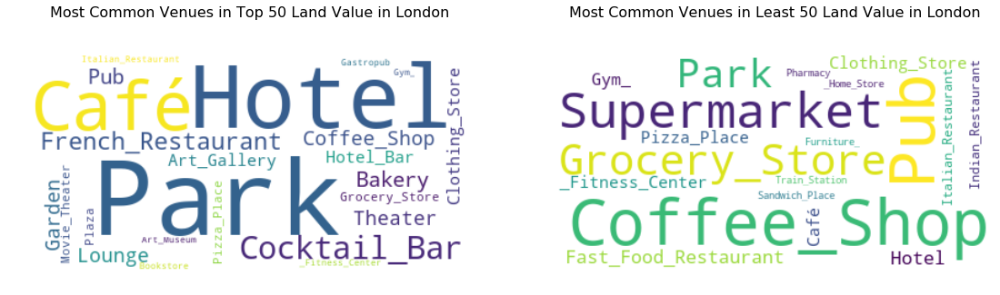

In [40]:
max_words = 80
word_string1 = ''
total1=top50_frequency_table['Frequency'].sum()
for category in top50_frequency_table.index.values:
    repeat_num_times1 = int(top50_frequency_table.loc[category, 'Frequency']/float(total1)*max_words)
    word_string1 = word_string1 + ((category + ' ') * repeat_num_times1)                              
wordcloud1 = WordCloud(background_color='white').generate(word_string1)

word_string2 = ''
total2=least50_frequency_table['Frequency'].sum()
for category in least50_frequency_table.index.values:
    repeat_num_times2 = int(least50_frequency_table.loc[category, 'Frequency']/float(total2)*max_words)
    word_string2 = word_string2 + ((category + ' ') * repeat_num_times2)                              
wordcloud2 = WordCloud(background_color='white').generate(word_string2)

fig = plt.figure()
fig.set_figwidth(19)
fig.set_figheight(19)
ax0 = fig.add_subplot(121) # add subplot 1 (1 row, 2 columns, first plot)
ax1 = fig.add_subplot(122) # add subplot 2 (1 row, 2 columns, second plot)

ax0.imshow(wordcloud1, interpolation='bilinear')
ax0.set_title('Most Common Venues in Top 50 Land Value in London\n\n',fontsize=16)
ax0.axis('off')

ax1.imshow(wordcloud2, interpolation='bilinear')
ax1.set_title('Most Common Venues in Least 50 Land Value in London\n\n',fontsize=16)
ax1.axis('off')

Explore the most common venues in Greater London area by restricting the boundaries of the search area.

In [41]:
LIMIT=2000
sw_lat=51.368262
sw_lng=-0.408792
ne_lat=51.669068
ne_lng=0.142564
greater_london_venues_list=[]
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&sw={},{}&ne={},{}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, VERSION, sw_lat, sw_lng, ne_lat, ne_lng, LIMIT)

results = requests.get(url).json()["response"]['groups'][0]['items']
greater_london_venues_list.append([(v['venue']['name'], v['venue']['location']['lat'], v['venue']['location']['lng'],  v['venue']['categories'][0]['name']) for v in results])

greater_london_nearby_venues = pd.DataFrame([item for venue_list in greater_london_venues_list for item in venue_list])
greater_london_nearby_venues.columns = ['Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']
results

[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4ac518cef964a5201aa620e3',
   'name': 'Hampstead Heath',
   'location': {'address': 'E Heath Rd',
    'lat': 51.56443609469711,
    'lng': -0.1673625476541929,
    'labeledLatLngs': [{'label': 'display',
      'lat': 51.56443609469711,
      'lng': -0.1673625476541929}],
    'postalCode': 'NW3 2PT',
    'cc': 'GB',
    'city': 'London',
    'state': 'Greater London',
    'country': 'United Kingdom',
    'formattedAddress': ['E Heath Rd',
     'London',
     'Greater London',
     'NW3 2PT',
     'United Kingdom']},
   'categories': [{'id': '4bf58dd8d48988d163941735',
     'name': 'Park',
     'pluralName': 'Parks',
     'shortName': 'Park',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/parks_outdoors/park_',
      'suffix': '.png'},
     'primary': True}],
   'photos': {'count': 0, 'groups': []}},
  'ref

Sort and count the frequency of venues in Greater London area.

In [42]:
greater_london_grouped_venues=greater_london_nearby_venues.groupby('Venue Category').count()
greater_london_grouped_venues.drop(['Venue Latitude', 'Venue Longitude'],axis=1,inplace=True)
greater_london_grouped_venues.rename(columns={'Venue':'Frequency'},inplace=True)
greater_london_grouped_venues.sort_values(['Frequency'], ascending=False, axis=0, inplace=True)

Build data visualization to find most common venues the Greater London area. We could see that Park, Botanical Garden and Theater, etc are the most common ones.

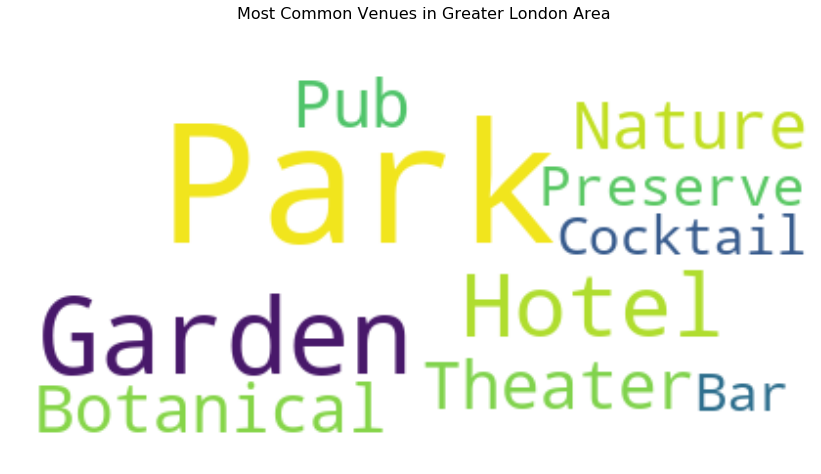

In [46]:
max_words2 = 49
word_string3 = ''
total3=greater_london_grouped_venues['Frequency'].sum()
for category in greater_london_grouped_venues.index.values:
    repeat_num_times3 = int(greater_london_grouped_venues.loc[category, 'Frequency']/float(total3)*max_words2)
    word_string3 = word_string3 + ((category + ' ') * repeat_num_times3)                              
wordcloud3 = WordCloud(background_color='white').generate(word_string3)

fig = plt.figure()
fig.set_figwidth(14)
fig.set_figheight(18)

plt.imshow(wordcloud3, interpolation='bilinear')
plt.axis('off')
plt.title('Most Common Venues in Greater London Area\n\n',fontsize=16)
plt.show()

Plot Top 10  common venues in Greater London, top 50 land value in London, least 50 land value in London respectively, and compare the result.

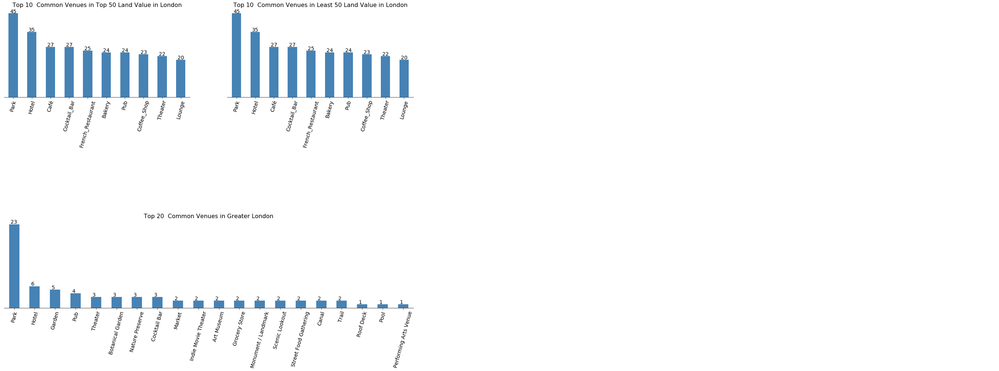

In [47]:
fig = plt.figure() # create figure
gs = gridspec.GridSpec(3,2)
ax0 = fig.add_subplot(gs[0,0]) # add subplot 1 (1 row, 2 columns, first plot)
ax1 = fig.add_subplot(gs[0,1]) # add subplot 2 (1 row, 2 columns, second plot)
ax2 = fig.add_subplot(gs[2,:])

ax2=greater_london_grouped_venues['Frequency'].head(20).plot(kind='bar', figsize=(20, 15), color='steelblue')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax2.set_title('Top 20  Common Venues in Greater London',fontsize=16)
ax2.tick_params(labelsize=14, rotation=75)
ax2.set_yticks([])
ax2.set_xlabel('')
for index, value in enumerate(greater_london_grouped_venues['Frequency']):
    ax2.annotate(str(value) ,(index-0.17,value+0.2),fontsize=14)

top50_common10['Frequency'].plot(kind='bar', figsize=(20, 15), color='steelblue', ax=ax0)
ax0.spines['top'].set_visible(False)
ax0.spines['right'].set_visible(False)
ax0.spines['left'].set_visible(False)
ax0.set_title('Top 10  Common Venues in Top 50 Land Value in London',fontsize=16)
ax0.tick_params(labelsize=14, rotation=75)
ax0.set_yticks([])
ax0.set_xlabel('')
for index, value in enumerate(top50_common10['Frequency']):
    ax0.annotate(str(value) ,(index-0.17,value+0.2),fontsize=14)

least50_common10['Frequency'].plot(kind='bar', figsize=(20, 15),color='steelblue', ax=ax1)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax1.set_title('Top 10  Common Venues in Least 50 Land Value in London',fontsize=16)
ax1.tick_params(labelsize=14,rotation=75)
ax1.set_yticks([])
ax1.set_xlabel('')
for index, value in enumerate(least50_common10['Frequency']):
    ax1.annotate(str(value) ,(index-0.17,value+0.2),fontsize=14)

Plot a map that contains top10 and least10 land value areas in London as well as the venues around them. The black circles are the location of top10 common venues in Greater London which are most located between these 2 areas.

In [48]:
map_greater_london = folium.Map(location=[latitude_L, longitude_L], zoom_start=11,tiles='cartodbpositron')
data_frame1=[greater_london_nearby_venues,london_top50_venues,london_least50_venues]
color1=['black','darkred','lightpink']
for data,color in zip(data_frame1,color1):
    for lat, lng, label in zip(data['Venue Latitude'], data['Venue Longitude'], data['Venue Category']):
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker([lat, lng],radius=3,popup=label,color=color,fill=True,fill_opacity=0.7,parse_html=False).add_to(map_greater_london )

data_frame2=[london_top50,london_least50]
color2=['darkred','lightpink']
for data,color in zip(data_frame2,color2):
    for lat, lng, postcode, avg_value in zip(data['Latitude'], data['Longitude'], data['Postcode'], data['Average Value']):
        label = 'Postcode: {}, Average Value: {}'.format(postcode, avg_value)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker([lat, lng],radius=15,popup=label,color=color,fill=True,fill_opacity=0.2,parse_html=False).add_to(map_greater_london)

map_greater_london 

Plot the value change of these 2 types of area, and we could see the top10 land value areas appreciate a little bit more than least10 areas.

Text(49, 2.9, '3.04%')

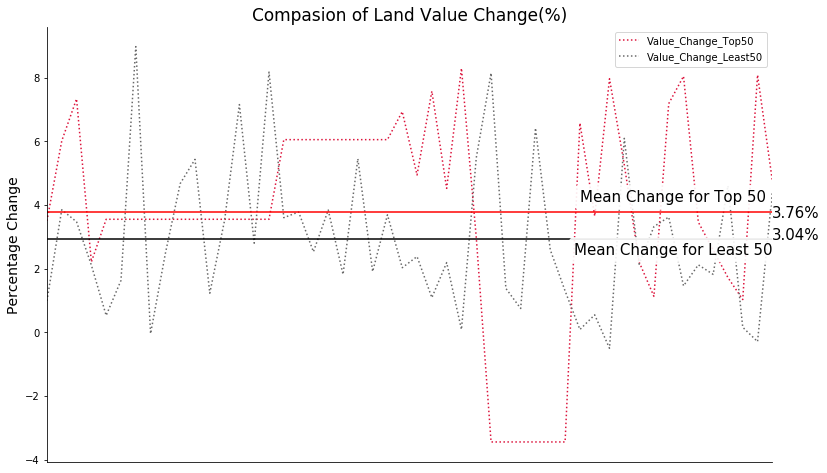

In [49]:
value_change=pd.DataFrame()
value_change['Value_Change_Top50']=london_top50['Value Change%']
value_change['Value_Change_Least50']=london_least50['Value Change%']

x=np.linspace(0,50,100)
y1=value_change.mean(axis=0)[0]*np.ones(100)
y2=value_change.mean(axis=0)[1]*np.ones(100)

color=['crimson','dimgrey']
ax=value_change.plot(kind='line', linestyle='dotted',figsize=(13, 8), color=color)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xticks([])
ax.set_title('Compasion of Land Value Change(%)',fontsize=17)
ax.set_ylabel('Percentage Change',fontsize=14)

ax.plot(x, y1, 'red')
ax.plot(x, y2, 'black')

ax.annotate('Mean Change for Top 50',xy=(36,4.1),bbox=dict(boxstyle="round", facecolor='white', edgecolor='white', alpha=0.9),fontsize=15)
ax.annotate('Mean Change for Least 50',xy=(35.6,2.45),bbox=dict(boxstyle="round", facecolor='white', edgecolor='white', alpha=0.9),fontsize=15)
ax.annotate('3.76%',xy=(49,3.6),fontsize=15)
ax.annotate('3.04%',xy=(49,2.9),fontsize=15)

#### Find Clusters

Run k-means to cluster the neighborhood into 5 clusters.

In [50]:
# set number of clusters
kclusters = 5
london_top_clustering = london_top50_grouped.drop('Postcode', 1) #1 represents column
london_least_clustering = london_least50_grouped.drop('Postcode', 1) #1 represents column

# run k-means clustering
kmeans_top = KMeans(n_clusters=kclusters, random_state=0).fit(london_top_clustering)
kmeans_least = KMeans(n_clusters=kclusters, random_state=0).fit(london_least_clustering)

# check cluster labels generated for each row in the dataframe
print(kmeans_top.labels_[0:10])
print(kmeans_least.labels_[0:10])

[0 0 2 0 0 0 0 0 0 0]
[1 0 3 3 4 1 4 4 4 4]


Create two new dataframes that include the cluster as well as the top 10 venues for each postcode area.

In [51]:
# add clustering labels
top50_venues_sorted.insert(0, 'Cluster Labels', kmeans_top.labels_)
least50_venues_sorted.insert(0, 'Cluster Labels', kmeans_least.labels_)

london_top_merged = london_top50
london_least_merged = london_least50

london_top_merged = london_top_merged.join(top50_venues_sorted.set_index('Postcode'), on='Postcode')
london_top_merged.dropna(subset=['Cluster Labels'], axis=0, inplace=True)
london_top_merged['Cluster Labels']=london_top_merged['Cluster Labels'].astype('int')

london_least_merged = london_least_merged.join(least50_venues_sorted.set_index('Postcode'), on='Postcode')
london_least_merged.dropna(subset=['Cluster Labels'], axis=0, inplace=True)
london_least_merged['Cluster Labels']=london_least_merged['Cluster Labels'].astype('int')

Visualize the resulting clusters.

In [52]:
# create map
map_top_clusters = folium.Map(location=[latitude_L, longitude_L], zoom_start=11,tiles='cartodbpositron')

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
for lat, lon, pos, cluster in zip(london_top_merged['Latitude'], london_top_merged['Longitude'], london_top_merged['Postcode'], london_top_merged['Cluster Labels']):
    label = folium.Popup(str(pos) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker([lat, lon],radius=5,popup=label,color=rainbow[cluster-1],fill=True,fill_color=rainbow[cluster-1],fill_opacity=0.7).add_to(map_top_clusters)

for lat, lng, label in zip(greater_london_nearby_venues['Venue Latitude'], greater_london_nearby_venues['Venue Longitude'], greater_london_nearby_venues['Venue Category']):
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker([lat, lng],radius=3,popup=label,color='dimgrey',fill=True,fill_opacity=0.7,parse_html=False).add_to(map_top_clusters )

map_top_clusters

In [53]:
# create map
map_least_clusters = folium.Map(location=[latitude_L, longitude_L], zoom_start=11,tiles='cartodbpositron')

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
for lat, lon, pos, cluster in zip(london_least_merged['Latitude'], london_least_merged['Longitude'], london_least_merged['Postcode'], london_least_merged['Cluster Labels']):
    label = folium.Popup(str(pos) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker([lat, lon],radius=5,popup=label,color=rainbow[cluster-1],fill=True,fill_color=rainbow[cluster-1],fill_opacity=0.7).add_to(map_least_clusters)

for lat, lng, label in zip(greater_london_nearby_venues['Venue Latitude'], greater_london_nearby_venues['Venue Longitude'], greater_london_nearby_venues['Venue Category']):
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker([lat, lng],radius=3,popup=label,color='dimgrey',fill=True,fill_opacity=0.7,parse_html=False).add_to(map_least_clusters )

map_least_clusters

## Discussion and Conclusion<a name="discussion&conclusion"></a>

From the statistical table and visualization tool, we could find that the land value in Greater London area is a circle that takes the city center as the center of circle, and gradually decreases toward its periphery. The closer to the center, the more expensive the housing price, and the price difference can be more than five times, which is huge. We mainly focus on the most valued and the least valued areas in GLA. For these different regions, the characteristic of data we find from FourSquare has big difference. In the central area, the most common venues are Park, Hotel, French Restaurant and Café etc., which are relatively high consumption place, and most of them are for people to socialize. However, around the fringe area, the most common venues are Coffee Shop, Supermarket, Grocery Store and Pub etc. Most are places to meet people's daily needs. When we expand the perspective again, to observe the whole situation in GLA, Park, Botanical Garden and Theater seem to be very popular, which are mainly distributed in the northeast in GLA between the two regions.

For a restaurant operator who wants to find a suitable place to open a business, it's important to choose a location based on his or her own situation. If he or she has a sufficient funding background, it is obvious that it can choose any place, including the city center. However, what we are discussing here is that most people would consider the cost of opening a new business. For person who has very little start-up capital, the mobile dining car is a very good choice. As the most popular in GLA are the Parks or Botanical Gardens which have open space and high traffic of people, more revenue will be generated, and it will not require much capital for land rental. For person who wants to find a place for opening a restaurant, he or she will need to consider the needs of people living in different regions as well as his or her foresight for the market, which could be the balance between revenue and cost, as well as the perspective on the housing market after the rising pressure from the Brexit, also, how much the COVID-19 will influence the housing price in GLA, it is still difficult to predict due to the rapidly changing market and policy from the government.

The gap in land value does not mean that there is a gap in wealth within people, because this is not persuasive, and further investigation and research are needed, but it can somewhat explain the difference in people's lifestyles. After all these analyses, I hope this analysis can be helpful for restaurant operators.